### *changelog/updates (twitter: @somewheresy if you have any revision requests)*




##### August 22, 2021: Fixed issues with temp filesystem not importing os, causing errors when not using Google Drive. In the future I'm not going to be maintaining support for using the temporary runtime directory because doing so is kind of stupid compared to just... hooking up Google Drive. Removed Wikiart 1024 dataset because the hosting provider went offline. Fixed ImageNet datasets to use new hosting provider
---
##### August 21, 2021: Fixed issues with CLIP-guided diffusion. Created absolute directories. Added ISR (Image Super-Resolution) for some basic de-noising based image upscaling.
---
##### August 18, 2021: Forked notebook from the original copy. Integrated Katherine Crowson's CLIP-guided diffusion method as a secondary mode to the notebook. Removed automatic video naming and exposed it as a parameter instead.
---
##### July 21, 2021: Changed video generation file name to use the prompt if provided
---
##### July 19, 2021: Fixed root path bug when opting out of Google Drive
---
##### July 18, 2021: Added Google Drive integration w/ support for project folders
---

# If you're looking for the S2 "Classic" VQGAN+CLIP notebook: [S2 VQGAN+CLIP Classic.ipynb](https://github.com/justin-bennington/somewhere-ml/blob/main/S2_VQGAN%2BCLIP_Classic.ipynb)

The notebook you're currently using is a multimodal GAN art generator patched together from various ML notebooks for generative art (see license). The results of this notebook may be distinct from others in the space due to different weights and an interative design process focusing on more "realistic" or "boring" results, so I've included the most stable release of the original notebook -- which is a bit more "machine-learningy" in terms of its qualitative output above.

This notebook is great for procedurally generating new images from a text prompt or input image. At Somewhere Systems we use this for everything from generative landscapes to materials design for 3D graphics. Consider checking out our work @ https://s2.lol and hiring us to demystify technology like AR, ML, etc. 

Tutorial/Docu:
https://tuscriaturas.miraheze.org/w/index.php?title=Ayuda:Generar_im%C3%A1genes_con_VQGAN%2BCLIP/English

In [1]:
#@title MIT License
# 

# Copyright (c) 2021 Katherine Crowson

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

In [2]:
#@markdown What GPU am I using?

#@markdown V100 > P100 > everything else
%history -g -f Local_S2_GAN_Art_Generator_(VQGAN,_CLIP,_Guided_Diffusion)-history.ipynb
!nvidia-smi --query-gpu=gpu_name,gpu_bus_id,vbios_version --format=csv
gpu_name = !nvidia-smi --query-gpu=gpu_name, --format=csv

name, pci.bus_id, vbios_version
GeForce RTX 3090, 00000000:01:00.0, 94.02.26.80.56


In [3]:
#@title Run this block if you don't want to use Google Drive (not recommended)
import os
abs_root_path = "./content"
def ensureProperRootPath():
    if len(abs_root_path) > 0:
        os.chdir(abs_root_path) # Changes directory to absolute root path
        print("Root path check: ")
        !pwd

ensureProperRootPath()
print("Well, I guess you're really bent on using the temporary runtime directory for some reason. Anyway, your root directory is: ")
!pwd
abs_root_path = "/venvs/venv-ub20/py38002/ai001/content"

Root path check: 
/venvs/venv-ub20/py38002/ai001/content
Well, I guess you're really bent on using the temporary runtime directory for some reason. Anyway, your root directory is: 
/venvs/venv-ub20/py38002/ai001/content


In [4]:
#@title Run this block to connect Google Drive (recommended)
#@markdown To connect Google Drive, set `root_path` to the relative drive folder path you want outputs to be saved to if you already made a directory, then execute this cell. Leaving the field blank or just not running this will have outputs save to the runtime temp storage.
#import os
#abs_root_path = "/content"

#from google.colab import drive
#drive.mount('/content/drive')

#def ensureProperRootPath():
#    if len(abs_root_path) > 0:
#        os.chdir(abs_root_path) # Changes directory to absolute root path
#        print("Root path check: ")
#        !pwd

#ensureProperRootPath()

In [5]:
#@title Make a new folder & set root path to that folder (optional)
#@markdown Saves a step if you don't have a folder in your Google Drive for this. Makes one, sets the root_path to that new folder. You can name it whatever you'd like:

#folder_name = "AI_ART" #@param {type: "string"}
#abs_root_path = "/content"
#if len(folder_name) > 0:
#    path_tmp = abs_root_path + "/drive/MyDrive/" + folder_name
#    if not os.path.exists(path_tmp):
#        os.mkdir(path_tmp)
#    abs_root_path = path_tmp

#print("Created folder & set root path to: " + abs_root_path)

#@markdown Make & assign path to a project subfolder (optional)

#project_name = "ALL_DATASETS_TEST" #@param {type: "string"}
#if len(project_name) > 0:
#      path_tmp = abs_root_path + "/" + project_name
#      if not os.path.exists(path_tmp):
#          os.mkdir(path_tmp)
#      abs_root_path = path_tmp
#print("Created project subfolder & set root path to: " + abs_root_path)

#ensureProperRootPath()

In [6]:
# @title Setup, Installing Libraries
# @markdown This cell might take some time due to installing several libraries.
import os 
!nvidia-smi
os.chdir("/venvs/venv-ub20/py38002/ai001/content")

print("Downloading CLIP...")
!pip install imagio 
!git clone https://github.com/openai/CLIP                 #&> /dev/null
!git clone https://github.com/crowsonkb/guided-diffusion  #&> /dev/null
!pip install -e ./CLIP                                    #&> /dev/null
print("Installing library for guided diffusion...")
!pip install -e ./guided-diffusion                        #&> /dev/null

print("Installing Python Libraries for AI")
!git clone https://github.com/CompVis/taming-transformers #&> /dev/null
!pip install ftfy regex tqdm omegaconf pytorch-lightning  #&> /dev/null
!pip install kornia                                       #&> /dev/null
!pip install einops                                       #&> /dev/null
print("Installing transformers library...")
!pip install transformers                                 #&> /dev/null
 
print("Installing libraries for managing metadata...")
!pip install stegano                                      #&> /dev/null
!apt install exempi                                       #&> /dev/null
!pip install python-xmp-toolkit                           #&> /dev/null
!pip install imgtag                                       #&> /dev/null
!pip install pillow==7.1.2                                #&> /dev/null    
!pip install taming-transformers                          #&> /dev/null   


                            

print("Installing ISR for image upscaling...")
!pip install ISR #&> /dev/null 

print("Installing ffmpeg for creating videos...")
!pip install imageio-ffmpeg #&> /dev/null

if not os.path.exists("/venvs/venv-ub20/py38002/ai001/content/vqgan-steps"):
    !mkdir "/venvs/venv-ub20/py38002/ai001/content/vqgan-steps" #&> /dev/null  
    print("No directory for VQGAN+CLIP image output found. Made directory: ~/vqgan-steps")
if not os.path.exists("/venvs/venv-ub20/py38002/ai001/content/diffusion-steps"):
    !mkdir "/venvs/venv-ub20/py38002/ai001/content/diffusion-steps" #&> /dev/null  
    print("No directory for CLIP-guided diffusion image output found. Made directory: ~/diffusion-steps")
!pip freeze > requirements.txt
print("Installation finished.")

Mon Sep 13 19:31:25 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.91.03    Driver Version: 460.91.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 3090    Off  | 00000000:01:00.0  On |                  N/A |
| 69%   56C    P3    85W / 370W |   1792MiB / 24265MiB |     24%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [7]:
#@title Selection of models to download
#@markdown Ensure you select a model you've downloaded in the parameters block

#@markdown *New!* It's CLIP-guided diffusion, a method that takes a bit longer to produce good results but generally makes more "realistic" interpretations of the prompt. If you'd like to use this, make sure to download Katherine Crowson's diffusion model. 
diffusion = False #@param {type: "boolean"}

#@markdown Models for VQGAN+CLIP method
imagenet_1024 = False #@param {type:"boolean"}
imagenet_16384 = True #@param {type:"boolean"}
coco = True #@param {type:"boolean"}
faceshq = True #@param {type:"boolean"}
# wikiart_1024 = True #@param {type:"boolean"}
wikiart_16384 = True #@param {type:"boolean"}
sflckr = True #@param {type:"boolean"}


if not os.path.exists("/venvs/venv-ub20/py38002/ai001/content/models"):
          os.mkdir("/venvs/venv-ub20/py38002/ai001/content/models")
os.chdir("/venvs/venv-ub20/py38002/ai001/content/models")
print("changing to models subdirectory: ")
!pwd

if imagenet_1024:
  # !curl -L -o vqgan_imagenet_f16_1024.yaml -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_1024.yaml' #ImageNet 1024
  # !curl -L -o vqgan_imagenet_f16_1024.ckpt -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_1024.ckpt'  #ImageNet 1024
  !curl -L -o vqgan_imagenet_f16_1024.ckpt -C - 'https://heibox.uni-heidelberg.de/f/140747ba53464f49b476/?dl=1' 
  !curl -L -o vqgan_imagenet_f16_1024.yaml -C - 'https://heibox.uni-heidelberg.de/f/6ecf2af6c658432c8298/?dl=1' 
  
if imagenet_16384:
  # !curl -L -o vqgan_imagenet_f16_16384.yaml -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_16384.yaml' #ImageNet 16384
  # !curl -L -o vqgan_imagenet_f16_16384.ckpt -C - 'http://mirror.io.community/blob/vqgan/vqgan_imagenet_f16_16384.ckpt' #ImageNet 16384
  !curl -L -o vqgan_imagenet_f16_16384.ckpt -C - 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1'
  !curl -L -o vqgan_imagenet_f16_16384.yaml -C - 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1'
if coco:
  !curl -L -o coco.yaml -C - 'https://dl.nmkd.de/ai/clip/coco/coco.yaml' #COCO
  !curl -L -o coco.ckpt -C - 'https://dl.nmkd.de/ai/clip/coco/coco.ckpt' #COCO
if faceshq:
  !curl -L -o faceshq.yaml -C - 'https://drive.google.com/uc?export=download&id=1fHwGx_hnBtC8nsq7hesJvs-Klv-P0gzT' #FacesHQ
  !curl -L -o faceshq.ckpt -C - 'https://app.koofr.net/content/links/a04deec9-0c59-4673-8b37-3d696fe63a5d/files/get/last.ckpt?path=%2F2020-11-13T21-41-45_faceshq_transformer%2Fcheckpoints%2Flast.ckpt' #FacesHQ
#if wikiart_1024: 
  #!curl -L -o wikiart_1024.yaml -C - 'http://mirror.io.community/blob/vqgan/wikiart.yaml' #WikiArt 1024
  #!curl -L -o wikiart_1024.ckpt -C - 'http://mirror.io.community/blob/vqgan/wikiart.ckpt' #WikiArt 1024
if wikiart_16384: 
  # !curl -L -o wikiart_16384.yaml -C - 'http://mirror.io.community/blob/vqgan/wikiart_16384.yaml' #WikiArt 16384
  # !curl -L -o wikiart_16384.ckpt -C - 'http://mirror.io.community/blob/vqgan/wikiart_16384.ckpt' #WikiArt 16384
  !curl -L -o wikiart_16384.ckpt -C - 'http://eaidata.bmk.sh/data/Wikiart_16384/wikiart_f16_16384_8145600.ckpt'
  !curl -L -o wikiart_16384.yaml -C - 'http://eaidata.bmk.sh/data/Wikiart_16384/wikiart_f16_16384_8145600.yaml'
if sflckr:
  !curl -L -o sflckr.yaml -C - 'https://heibox.uni-heidelberg.de/d/73487ab6e5314cb5adba/files/?p=%2Fconfigs%2F2020-11-09T13-31-51-project.yaml&dl=1' #S-FLCKR
  !curl -L -o sflckr.ckpt -C - 'https://heibox.uni-heidelberg.de/d/73487ab6e5314cb5adba/files/?p=%2Fcheckpoints%2Flast.ckpt&dl=1' #S-FLCKR
if diffusion:
  # Download the diffusion model
  !curl -L -o 512x512_diffusion_uncond_finetune_008100.pt -C - 'https://the-eye.eu/public/AI/models/512x512_diffusion_unconditional_ImageNet/512x512_diffusion_uncond_finetune_008100.pt' #DIFFUSION 512
  !curl -L -o 512x512_diffusion_uncond_finetune_008100.pt -C - 'https://the-eye.eu/public/AI/models/512x512_diffusion_unconditional_ImageNet/512x512_diffusion_uncond_finetune_008100.pt' #DIFFUSION 256

changing to models subdirectory: 
/venvs/venv-ub20/py38002/ai001/content/models
** Resuming transfer from byte position 980092370
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
** Resuming transfer from byte position 692
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
** Resuming transfer from byte position 1980
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Lef

In [8]:
!pip3 install --pre torch torchvision torchaudio -f https://download.pytorch.org/whl/nightly/cu111/torch_nightly.html --ignore-installed
!pip install ipywidgets
!pip install tensorflow
!pip install ISR --no-deps

Looking in links: https://download.pytorch.org/whl/nightly/cu111/torch_nightly.html
  Using cached https://download.pytorch.org/whl/nightly/cu111/torch-1.10.0.dev20210913%2Bcu111-cp38-cp38-linux_x86_64.whl (2136.8 MB)
  Using cached https://download.pytorch.org/whl/nightly/cu111/torchvision-0.11.0.dev20210913%2Bcu111-cp38-cp38-linux_x86_64.whl (21.9 MB)
  Using cached https://download.pytorch.org/whl/nightly/cu111/torchaudio-0.10.0.dev20210913%2Bcu111-cp38-cp38-linux_x86_64.whl (2.2 MB)
  Using cached typing_extensions-3.10.0.2-py3-none-any.whl (26 kB)
  Using cached Pillow-8.3.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.0 MB)
  Using cached numpy-1.21.2-cp38-cp38-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (15.8 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
isr 2.2.0 requires pyaml, which is not installed.
tensorflow 2.6.0 requires n

In [9]:
# @title Load libraries and definitions
print(abs_root_path)
#os.chdir(abs_root_path)
os.chdir("/venvs/venv-ub20/py38002/ai001/content")
!pwd

import argparse
import math
from pathlib import Path
import io
import sys


 
sys.path.append('./taming-transformers')
from IPython import display
from base64 import b64encode
from omegaconf import OmegaConf
from PIL import Image
from taming.models import cond_transformer, vqgan
import torch
from torch import nn, optim
from torch.nn import functional as F
from torchvision import transforms
from torchvision.transforms import functional as TF
from tqdm.notebook import tqdm
 
from CLIP import clip
import kornia.augmentation as K
import numpy as np
import imageio
from PIL import ImageFile, Image
from imgtag import ImgTag    # metadata
from libxmp import *         # metadata
import libxmp                # metadata
from stegano import lsb
import json
ImageFile.LOAD_TRUNCATED_IMAGES = True

sys.path.append('./CLIP')
sys.path.append('./guided-diffusion')

import clip
from guided_diffusion.script_util import create_model_and_diffusion, model_and_diffusion_defaults

def sinc(x):
    return torch.where(x != 0, torch.sin(math.pi * x) / (math.pi * x), x.new_ones([]))
 
 
def lanczos(x, a):
    cond = torch.logical_and(-a < x, x < a)
    out = torch.where(cond, sinc(x) * sinc(x/a), x.new_zeros([]))
    return out / out.sum()
 
 
def ramp(ratio, width):
    n = math.ceil(width / ratio + 1)
    out = torch.empty([n])
    cur = 0
    for i in range(out.shape[0]):
        out[i] = cur
        cur += ratio
    return torch.cat([-out[1:].flip([0]), out])[1:-1]
 
 
def resample(input, size, align_corners=True):
    n, c, h, w = input.shape
    dh, dw = size
 
    input = input.view([n * c, 1, h, w])
 
    if dh < h:
        kernel_h = lanczos(ramp(dh / h, 2), 2).to(input.device, input.dtype)
        pad_h = (kernel_h.shape[0] - 1) // 2
        input = F.pad(input, (0, 0, pad_h, pad_h), 'reflect')
        input = F.conv2d(input, kernel_h[None, None, :, None])
 
    if dw < w:
        kernel_w = lanczos(ramp(dw / w, 2), 2).to(input.device, input.dtype)
        pad_w = (kernel_w.shape[0] - 1) // 2
        input = F.pad(input, (pad_w, pad_w, 0, 0), 'reflect')
        input = F.conv2d(input, kernel_w[None, None, None, :])
 
    input = input.view([n, c, h, w])
    return F.interpolate(input, size, mode='bicubic', align_corners=align_corners)
 
 
class ReplaceGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x_forward, x_backward):
        ctx.shape = x_backward.shape
        return x_forward
 
    @staticmethod
    def backward(ctx, grad_in):
        return None, grad_in.sum_to_size(ctx.shape)
 
 
replace_grad = ReplaceGrad.apply
 
 
class ClampWithGrad(torch.autograd.Function):
    @staticmethod
    def forward(ctx, input, min, max):
        ctx.min = min
        ctx.max = max
        ctx.save_for_backward(input)
        return input.clamp(min, max)
 
    @staticmethod
    def backward(ctx, grad_in):
        input, = ctx.saved_tensors
        return grad_in * (grad_in * (input - input.clamp(ctx.min, ctx.max)) >= 0), None, None
 
 
clamp_with_grad = ClampWithGrad.apply
 
 
def vector_quantize(x, codebook):
    d = x.pow(2).sum(dim=-1, keepdim=True) + codebook.pow(2).sum(dim=1) - 2 * x @ codebook.T
    indices = d.argmin(-1)
    x_q = F.one_hot(indices, codebook.shape[0]).to(d.dtype) @ codebook
    return replace_grad(x_q, x)
 
 
class Prompt(nn.Module):
    def __init__(self, embed, weight=1., stop=float('-inf')):
        super().__init__()
        self.register_buffer('embed', embed)
        self.register_buffer('weight', torch.as_tensor(weight))
        self.register_buffer('stop', torch.as_tensor(stop))
 
    def forward(self, input):
        input_normed = F.normalize(input.unsqueeze(1), dim=2)
        embed_normed = F.normalize(self.embed.unsqueeze(0), dim=2)
        dists = input_normed.sub(embed_normed).norm(dim=2).div(2).arcsin().pow(2).mul(2)
        dists = dists * self.weight.sign()
        return self.weight.abs() * replace_grad(dists, torch.maximum(dists, self.stop)).mean()
 
 
def parse_prompt(prompt):
    vals = prompt.rsplit(':', 2)
    vals = vals + ['', '1', '-inf'][len(vals):]
    return vals[0], float(vals[1]), float(vals[2])
 
 
class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow
        self.augs = nn.Sequential(
            K.RandomHorizontalFlip(p=0.5),
            # K.RandomSolarize(0.01, 0.01, p=0.7),
            K.RandomSharpness(0.3,p=0.4),
            K.RandomAffine(degrees=30, translate=0.1, p=0.8, padding_mode='border'),
            K.RandomPerspective(0.2,p=0.4),
            K.ColorJitter(hue=0.01, saturation=0.01, p=0.7))
        self.noise_fac = 0.1
 
 
    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        for _ in range(self.cutn):
            size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
            offsetx = torch.randint(0, sideX - size + 1, ())
            offsety = torch.randint(0, sideY - size + 1, ())
            cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
            cutouts.append(resample(cutout, (self.cut_size, self.cut_size)))
        batch = self.augs(torch.cat(cutouts, dim=0))
        if self.noise_fac:
            facs = batch.new_empty([self.cutn, 1, 1, 1]).uniform_(0, self.noise_fac)
            batch = batch + facs * torch.randn_like(batch)
        return batch
 
 
def load_vqgan_model(config_path, checkpoint_path):
    config = OmegaConf.load(config_path)
    if config.model.target == 'taming.models.vqgan.VQModel':
        model = vqgan.VQModel(**config.model.params)
        model.eval().requires_grad_(False)
        model.init_from_ckpt(checkpoint_path)
    elif config.model.target == 'taming.models.cond_transformer.Net2NetTransformer':
        parent_model = cond_transformer.Net2NetTransformer(**config.model.params)
        parent_model.eval().requires_grad_(False)
        parent_model.init_from_ckpt(checkpoint_path)
        model = parent_model.first_stage_model
    else:
        raise ValueError(f'unknown model type: {config.model.target}')
    del model.loss
    return model
 
 
def resize_image(image, out_size):
    ratio = image.size[0] / image.size[1]
    area = min(image.size[0] * image.size[1], out_size[0] * out_size[1])
    size = round((area * ratio)**0.5), round((area / ratio)**0.5)
    return image.resize(size, Image.LANCZOS)

# Define necessary functions for CLIP guided diffusion

def fetch(url_or_path):
    if str(url_or_path).startswith('http://') or str(url_or_path).startswith('https://'):
        r = requests.get(url_or_path)
        r.raise_for_status()
        fd = io.BytesIO()
        fd.write(r.content)
        fd.seek(0)
        return fd
    return open(url_or_path, 'rb')

class MakeCutouts(nn.Module):
    def __init__(self, cut_size, cutn, cut_pow=1.):
        super().__init__()
        self.cut_size = cut_size
        self.cutn = cutn
        self.cut_pow = cut_pow

    def forward(self, input):
        sideY, sideX = input.shape[2:4]
        max_size = min(sideX, sideY)
        min_size = min(sideX, sideY, self.cut_size)
        cutouts = []
        for _ in range(self.cutn):
            size = int(torch.rand([])**self.cut_pow * (max_size - min_size) + min_size)
            offsetx = torch.randint(0, sideX - size + 1, ())
            offsety = torch.randint(0, sideY - size + 1, ())
            cutout = input[:, :, offsety:offsety + size, offsetx:offsetx + size]
            cutouts.append(F.adaptive_avg_pool2d(cutout, self.cut_size))
        return torch.cat(cutouts)


def spherical_dist_loss(x, y):
    x = F.normalize(x, dim=-1)
    y = F.normalize(y, dim=-1)
    return (x - y).norm(dim=-1).div(2).arcsin().pow(2).mul(2)


def tv_loss(input):
    """L2 total variation loss, as in Mahendran et al."""
    input = F.pad(input, (0, 1, 0, 1), 'replicate')
    x_diff = input[..., :-1, 1:] - input[..., :-1, :-1]
    y_diff = input[..., 1:, :-1] - input[..., :-1, :-1]
    return (x_diff**2 + y_diff**2).mean([1, 2, 3])



/venvs/venv-ub20/py38002/ai001/content
/venvs/venv-ub20/py38002/ai001/content


/venvs/venv-ub20/py38002/ai001/content/CLIP/clip/clip.py:23: UserWarning: PyTorch version 1.7.1 or higher is recommended
  warnings.warn("PyTorch version 1.7.1 or higher is recommended")
/venvs/venv-ub20/py38002/ai001/content/CLIP/clip/clip.py:23: UserWarning: PyTorch version 1.7.1 or higher is recommended
  warnings.warn("PyTorch version 1.7.1 or higher is recommended")


## Implementation tools
Mainly what you will have to modify will be `texts:`, there you can place the text (s) you want to generate (separated with `|`). It is a list because you can put more than one text, and so the AI ​​tries to 'mix' the images, giving the same priority to both texts.

To use an initial image to the model, you just have to upload a file to the Colab environment (in the section on the left), and then modify `initial_image:` putting the exact name of the file. Example: `sample.png`

You can also modify the model by changing the lines that say `model:`. Currently 1024, 16384, WikiArt, S-FLCKR and COCO-Stuff are available. To activate them you have to have downloaded them first, and then you can simply select it.

You can also use `target_images`, which is basically putting one or more images on it that the AI ​​will take as a" target ", fulfilling the same function as using a text input. To put more than one you have to use `|` as a separator.

In [10]:
#@markdown #Initialize Parameters
os.chdir("/venvs/venv-ub20/py38002/ai001/content")

seed = 555#@param {type:"number"}

display_frequency =  100#@param {type:"number"}

#@markdown #VQGAN+CLIP Parameters
#prompts = "medusa hydra chimera hybrid monster flying in saturn | vray unreal engine style" #@param {type:"string"} #In the text prompt section, adding phases like “unreal engine,” “hyperrealistic,” “photorealistic,” and “render” produces more HD-like results, which is pretty funny.
#Style Keywords
# https://imgur.com/a/SALxbQm
# https://creator.nightcafe.studio/vqgan-clip-keyword-modifier-comparison
#prompts = "medusa hydra chimera hybrid monster flying in saturn | blue lens flare jj abrams style"
prompts = "jesus the java developer | blue lens flare jj abrams style"
width =  1072#@param {type:"number"} max 850 928x522
height =  603#@param {type:"number"} max 850
model = "vqgan_imagenet_f16_16384" #@param ["vqgan_imagenet_f16_16384", "vqgan_imagenet_f16_1024", "wikiart_16384", "coco", "faceshq", "sflckr"]
initial_image = ""#@param {type:"string"}
target_images = ""#@param {type:"string"}
max_iterations = 1000#@param {type:"number"}
input_images = ""

#@markdown # CLIP Guided Diffusion Parameters
#@markdown ### To use CLIP guided diffusion in place of the method above, check the box below. WARNING: This requires access to 16GB of VRAM reliably, so may not work for users not using Colab Pro/+
usingDiffusion = False#@param {type:"boolean"}

prompt = ''#@param {type:"string"}
batch_size = 1#@param {type:"number"}
    #@markdown Controls how much the image should look like the prompt.
clip_guidance_scale = 1000#@param {type:"number"}  
    #@markdown Controls the smoothness of the final output.
tv_scale = 150#@param {type:"number"}             
cutn = 40#@param {type:"number"}
cut_pow = 0.5#@param {type:"number"}
n_batches = 1#@param {type:"number"}
    #@markdown This can be an URL or Colab local path and must be in quotes.
init_image = None #@param {type:"string"}
    #@markdown This needs to be between approx. 200 and 500 when using an init image.  
    #@markdown Higher values make the output look more like the init.
skip_timesteps = 0#@param {type:"number"}  
                        


model_names={"vqgan_imagenet_f16_16384": 'ImageNet 16384',"vqgan_imagenet_f16_1024":"ImageNet 1024", 
                 "wikiart_1024":"WikiArt 1024", "wikiart_16384":"WikiArt 16384", "coco":"COCO-Stuff", "faceshq":"FacesHQ", "sflckr":"S-FLCKR"}
model_name = model_names[model]     

if seed == -1:
    seed = None
if initial_image == "None":
    initial_image = None
if target_images == "None" or not target_images:
    target_images = []
else:
    target_images = target_images.split("|")
    target_images = [image.strip() for image in target_images]

if initial_image or target_images != []:
    input_images = True

prompts = [frase.strip() for frase in prompts.split("|")]
if prompts == ['']:
    prompts = []



diff_image_size = 256 # size of image when using diffusion
diff_image_size = int(diff_image_size)

Executing using VQGAN+CLIP method
Using device: cuda:0
Using text prompt: ['jesus the java developer', 'blue lens flare jj abrams style']
Using seed: 555
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from models/vqgan_imagenet_f16_16384.ckpt


0it [00:00, ?it/s]

i: 0, loss: 1.92697, losses: 0.971391, 0.955576


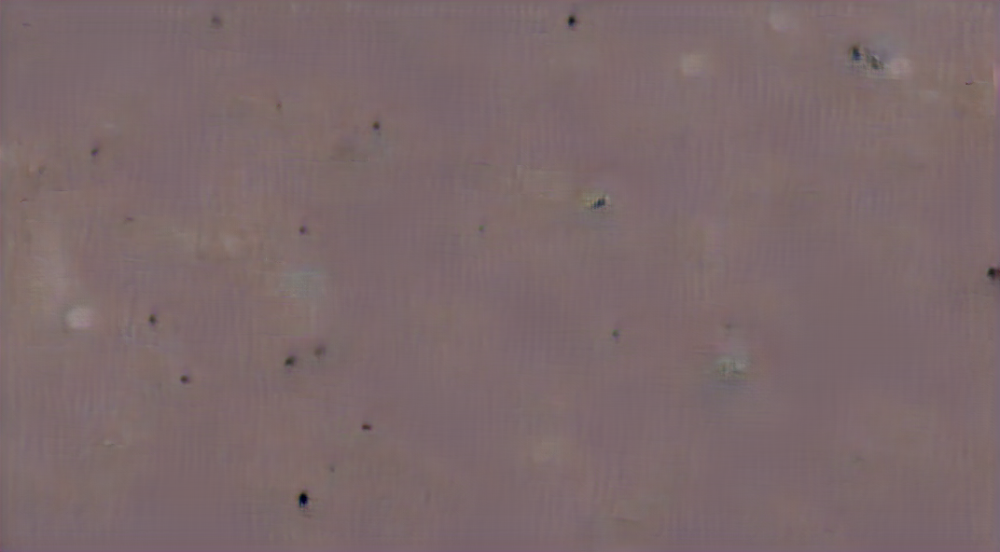

i: 100, loss: 1.57531, losses: 0.827491, 0.747822


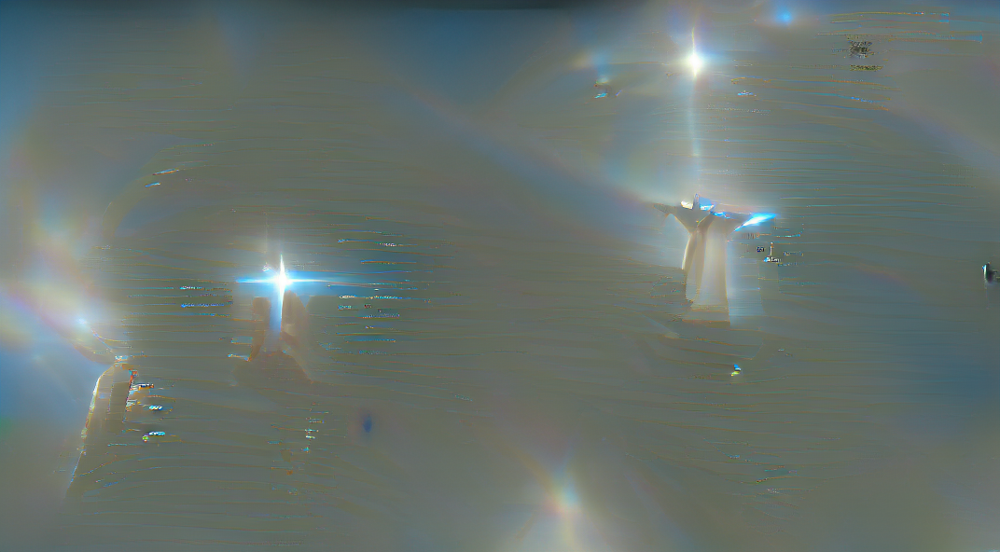

i: 200, loss: 1.45144, losses: 0.727752, 0.723691


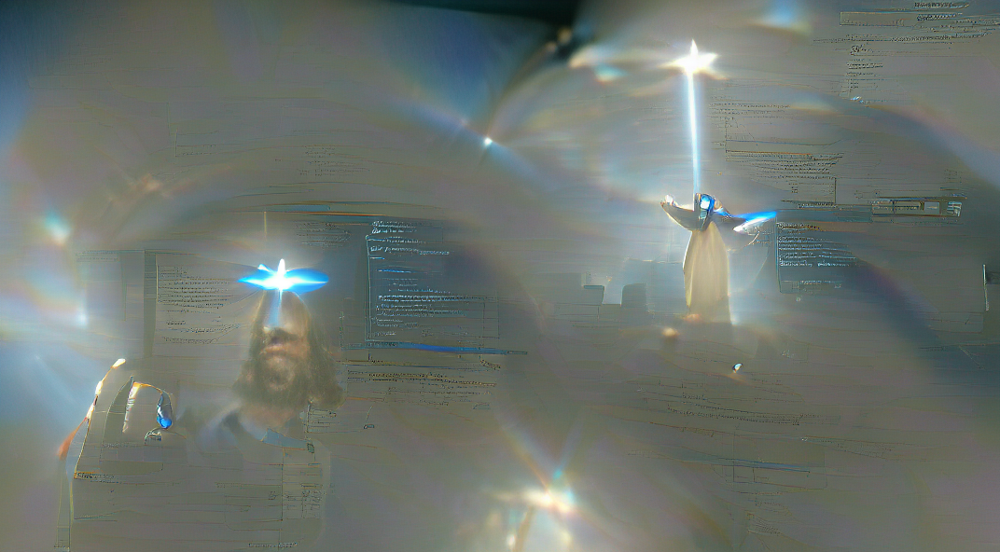

i: 300, loss: 1.41467, losses: 0.693875, 0.720793


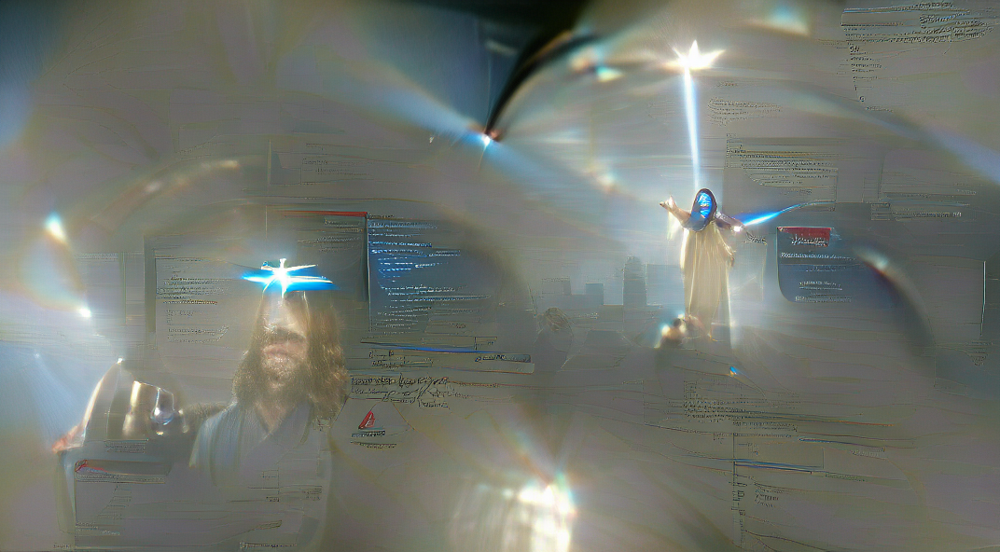

i: 400, loss: 1.41136, losses: 0.696805, 0.71455


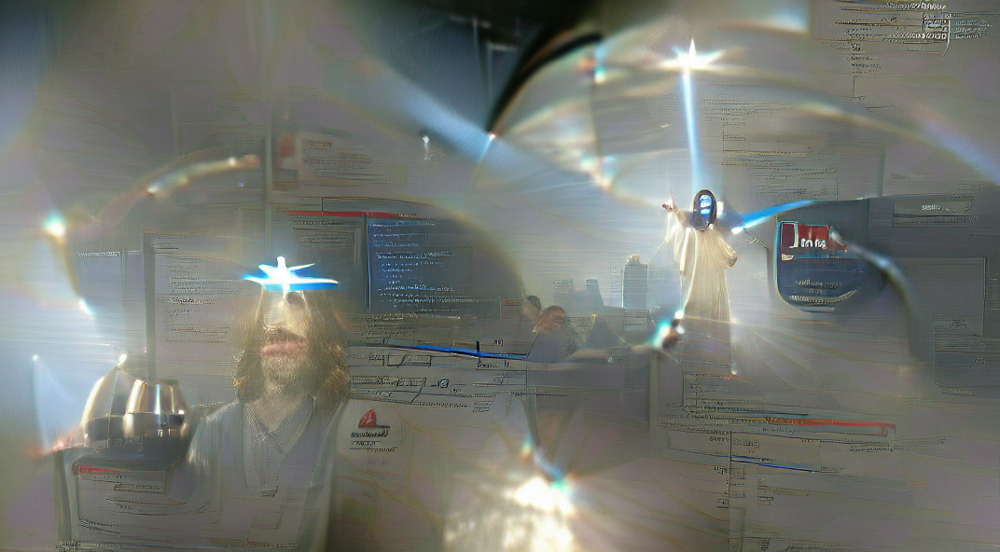

i: 500, loss: 1.36742, losses: 0.679767, 0.687655


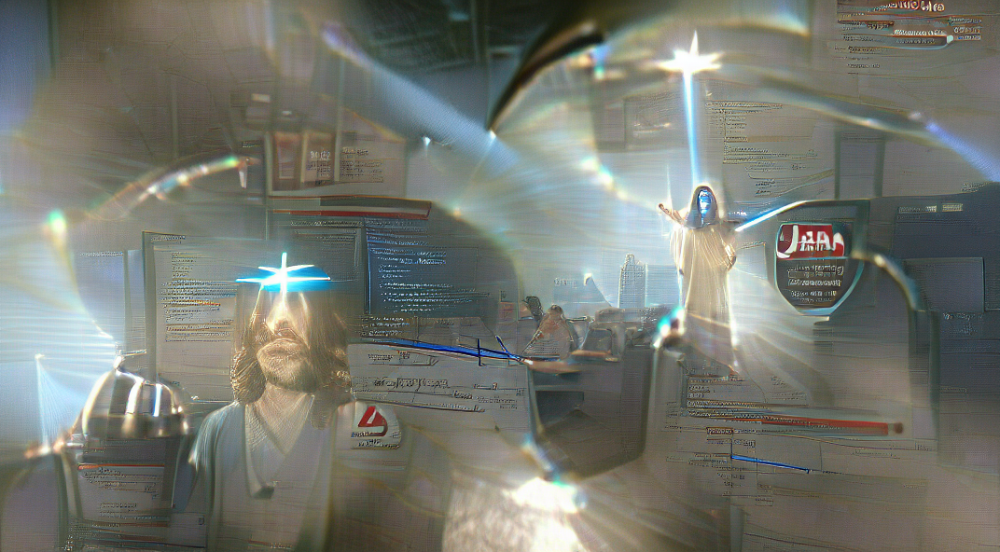

i: 600, loss: 1.29909, losses: 0.64394, 0.655146


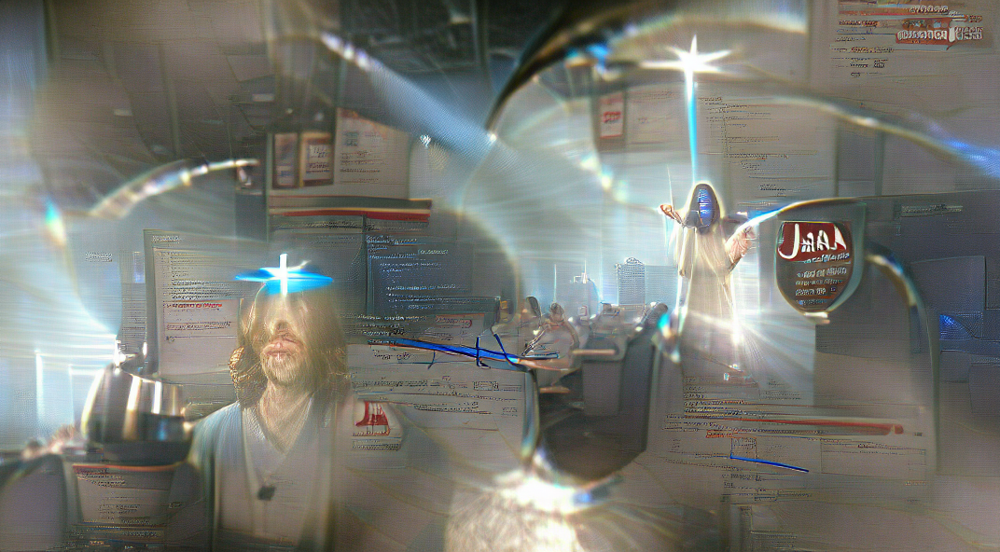

i: 700, loss: 1.31231, losses: 0.655715, 0.656599


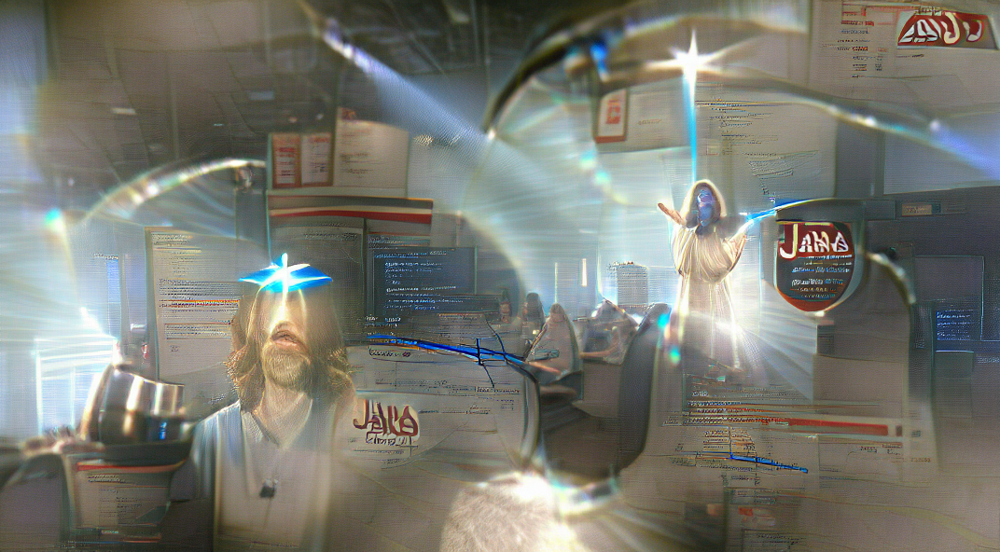

i: 800, loss: 1.28201, losses: 0.63856, 0.643447


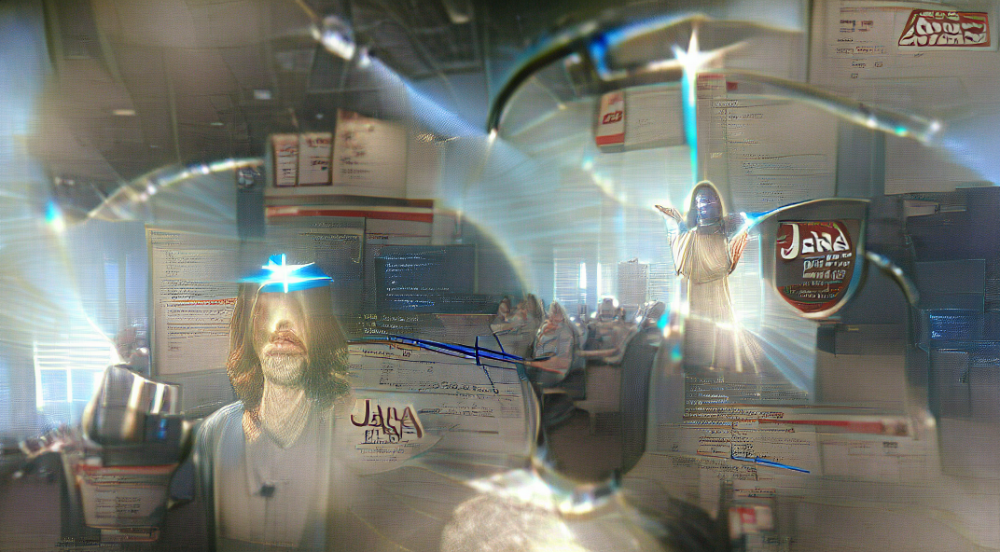

i: 900, loss: 1.30035, losses: 0.655068, 0.645284


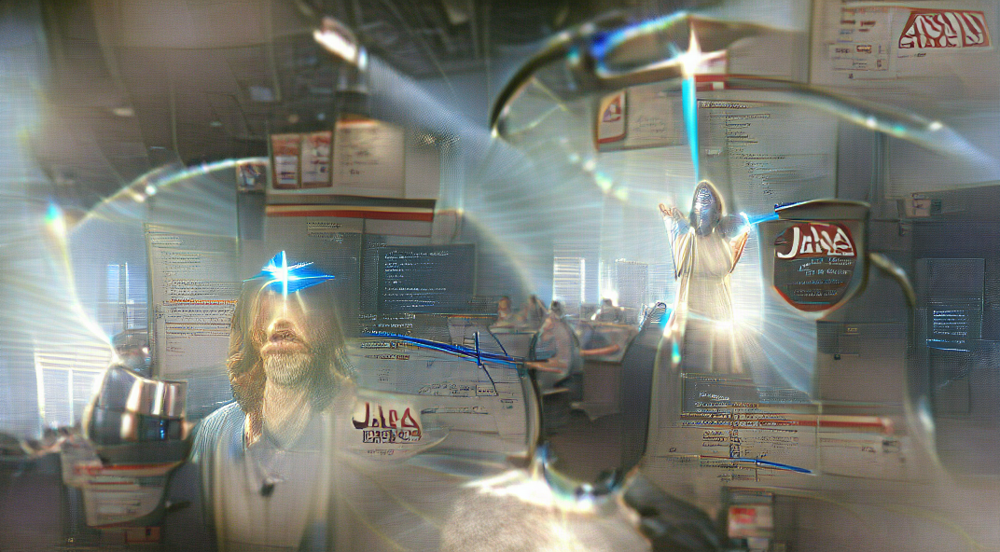

i: 1000, loss: 1.2803, losses: 0.636035, 0.644263


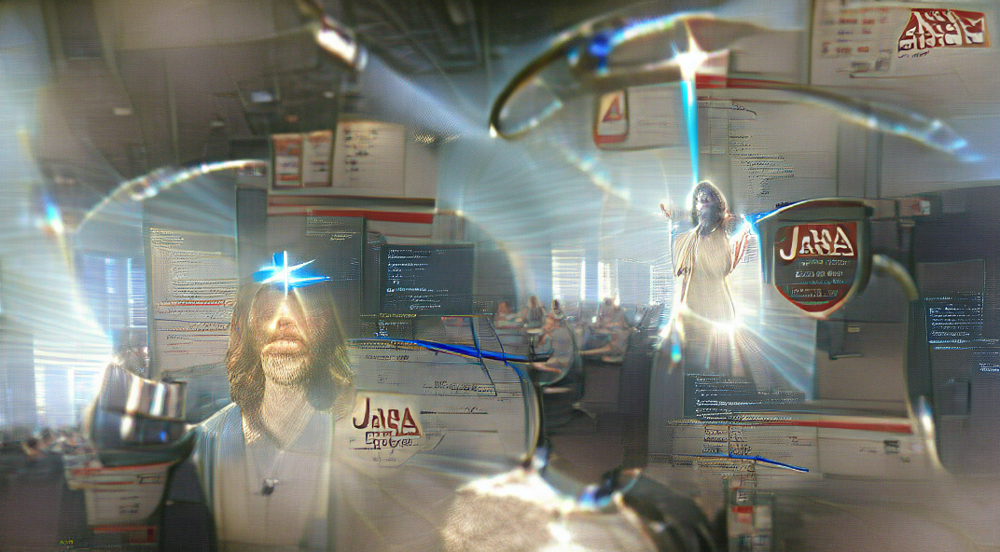

In [11]:
#@title Execution
os.chdir("/venvs/venv-ub20/py38002/ai001/content")

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

if (usingDiffusion == False):
    args = argparse.Namespace(
        prompts=prompts,
        image_prompts=target_images,
        noise_prompt_seeds=[],
        noise_prompt_weights=[],
        size=[width, height],
        init_image=initial_image,
        init_weight=0.,
        clip_model='ViT-B/32',
        vqgan_config=f'models/{model}.yaml',
        vqgan_checkpoint=f'models/{model}.ckpt',
        step_size=0.1,
        cutn=64,
        cut_pow=1.,
        display_freq=display_frequency,
        seed=seed,
    )
    notebook_name = "VQGAN+CLIP"
    print('Executing using VQGAN+CLIP method')
    print('Using device:', device)
    if prompts:
        print('Using text prompt:', prompts)
    if target_images:
        print('Using image prompts:', target_images)
    if args.seed is None:
        seed = torch.seed()
    else:
        seed = args.seed
    torch.manual_seed(seed)
    print('Using seed:', seed)

    model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
    perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

    cut_size = perceptor.visual.input_resolution
    e_dim = model.quantize.e_dim
    f = 2**(model.decoder.num_resolutions - 1)
    make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)
    n_toks = model.quantize.n_e
    toksX, toksY = args.size[0] // f, args.size[1] // f
    sideX, sideY = toksX * f, toksY * f
    z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
    z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


    if args.init_image:
        pil_image = Image.open(args.init_image).convert('RGB')
        pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
        z, *_ = model.encode(TF.to_tensor(pil_image).to(device).unsqueeze(0) * 2 - 1)
    else:
        one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
        z = one_hot @ model.quantize.embedding.weight
        z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)
    z_orig = z.clone()
    z.requires_grad_(True)
    opt = optim.Adam([z], lr=args.step_size)

    normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                    std=[0.26862954, 0.26130258, 0.27577711])

    pMs = []

    for prompt in args.prompts:
        txt, weight, stop = parse_prompt(prompt)
        embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))

    for prompt in args.image_prompts:
        path, weight, stop = parse_prompt(prompt)
        img = resize_image(Image.open(path).convert('RGB'), (sideX, sideY))
        batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
        embed = perceptor.encode_image(normalize(batch)).float()
        pMs.append(Prompt(embed, weight, stop).to(device))

    for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
        gen = torch.Generator().manual_seed(seed)
        embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
        pMs.append(Prompt(embed, weight).to(device))

    def synth(z):
        z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
        return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

    def add_xmp_data(nombrefichero):
        image = ImgTag(filename=nombrefichero)
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'creator', 'VQGAN+CLIP', {"prop_array_is_ordered":True, "prop_value_is_array":True})
        if args.prompts:
            image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', " | ".join(args.prompts), {"prop_array_is_ordered":True, "prop_value_is_array":True})
        else:
            image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', 'None', {"prop_array_is_ordered":True, "prop_value_is_array":True})
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'i', str(i), {"prop_array_is_ordered":True, "prop_value_is_array":True})
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'model', model_name, {"prop_array_is_ordered":True, "prop_value_is_array":True})
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'seed',str(seed) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'input_images',str(input_images) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
        #for frases in args.prompts:
        #    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'Prompt' ,frases, {"prop_array_is_ordered":True, "prop_value_is_array":True})
        image.close()

    def add_stegano_data(filename):
        data = {
            "title": " | ".join(args.prompts) if args.prompts else None,
            "notebook": notebook_name,
            "i": i,
            "model": model_name,
            "seed": str(seed),
            "input_images": input_images
        }
        lsb.hide(filename, json.dumps(data)).save(filename)

    @torch.no_grad()
    def checkin(i, losses):
        losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
        tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
        out = synth(z)
        TF.to_pil_image(out[0].cpu()).save('progress.png')
        add_stegano_data('progress.png')
        add_xmp_data('progress.png')
        display.display(display.Image('progress.png'))

    def ascend_txt():
        global i
        out = synth(z)
        iii = perceptor.encode_image(normalize(make_cutouts(out))).float()

        result = []

        if args.init_weight:
            result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)

        for prompt in pMs:
            result.append(prompt(iii))
        img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
        img = np.transpose(img, (1, 2, 0))
        filename = f"vqgan-steps/{i:04}.png"
        imageio.imwrite(filename, np.array(img))
        add_stegano_data(filename)
        add_xmp_data(filename)
        return result

    def train(i):
        opt.zero_grad()
        lossAll = ascend_txt()
        if i % args.display_freq == 0:
            checkin(i, lossAll)
        loss = sum(lossAll)
        loss.backward()
        opt.step()
        with torch.no_grad():
            z.copy_(z.maximum(z_min).minimum(z_max))

    i = 0
    try:
        with tqdm() as pbar:
            while True:
                train(i)
                if i == max_iterations:
                    break
                i += 1
                pbar.update()
    except KeyboardInterrupt:
        pass
else:
    
    model_config = model_and_diffusion_defaults()
    model_config.update({
        'attention_resolutions': '32, 16, 8',
        'class_cond': False,
        'diffusion_steps': 1000,
        'rescale_timesteps': True,
        'timestep_respacing': '1000',  # Modify this value to decrease the number of
                                      # timesteps.
        'image_size': 512,
        'learn_sigma': True,
        'noise_schedule': 'linear',
        'num_channels': 256,
        'num_head_channels': 64,
        'num_res_blocks': 2,
        'resblock_updown': True,
        'use_fp16': True,
        'use_scale_shift_norm': True,
    })
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    print('Executing using CLIP guided diffusion method')
    if (prompt != None):
      print('Using prompt: '+ prompt)

    print('Using device:', device)

    model, diffusion = create_model_and_diffusion(**model_config)
    model.load_state_dict(torch.load(abs_root_path + "/models/" + '512x512_diffusion_uncond_finetune_008100.pt', map_location='cpu'))
    model.requires_grad_(False).eval().to(device)
    for name, param in model.named_parameters():
        if 'qkv' in name or 'norm' in name or 'proj' in name:
            param.requires_grad_()
    if model_config['use_fp16']:
        model.convert_to_fp16()

    clip_model = clip.load('ViT-B/16', jit=False)[0].eval().requires_grad_(False).to(device)
    clip_size = clip_model.visual.input_resolution
    normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                    std=[0.26862954, 0.26130258, 0.27577711])
    def do_run():
        if seed is not None:
            torch.manual_seed(seed)

        text_embed = clip_model.encode_text(clip.tokenize(prompt).to(device)).float()

        init = None
        if init_image is not None:
            init = Image.open(fetch(init_image)).convert('RGB')
            init = init.resize((model_config['image_size'], model_config['image_size']), Image.LANCZOS)
            init = TF.to_tensor(init).to(device).unsqueeze(0).mul(2).sub(1)

        make_cutouts = MakeCutouts(clip_size, cutn, cut_pow)

        cur_t = None

        def cond_fn(x, t, y=None):
            with torch.enable_grad():
                x = x.detach().requires_grad_()
                n = x.shape[0]
                my_t = torch.ones([n], device=device, dtype=torch.long) * cur_t
                out = diffusion.p_mean_variance(model, x, my_t, clip_denoised=False, model_kwargs={'y': y})
                fac = diffusion.sqrt_one_minus_alphas_cumprod[cur_t]
                x_in = out['pred_xstart'] * fac + x * (1 - fac)
                clip_in = normalize(make_cutouts(x_in.add(1).div(2)))
                image_embeds = clip_model.encode_image(clip_in).float().view([cutn, n, -1])
                dists = spherical_dist_loss(image_embeds, text_embed.unsqueeze(0))
                losses = dists.mean(0)
                tv_losses = tv_loss(x_in)
                loss = losses.sum() * clip_guidance_scale + tv_losses.sum() * tv_scale
                return -torch.autograd.grad(loss, x)[0]

        if model_config['timestep_respacing'].startswith('ddim'):
            sample_fn = diffusion.ddim_sample_loop_progressive
        else:
            sample_fn = diffusion.p_sample_loop_progressive

        for i in range(n_batches):
            cur_t = diffusion.num_timesteps - skip_timesteps - 1

            samples = sample_fn(
                model,
                (batch_size, 3, model_config['image_size'], model_config['image_size']),
                clip_denoised=False,
                model_kwargs={},
                cond_fn=cond_fn,
                progress=True,
                skip_timesteps=skip_timesteps,
                init_image=init,
                randomize_class=True,
            )
            
            for j, sample in enumerate(samples):
                cur_t -= 1
                if j % display_frequency == 0 or cur_t == -1:
                    print()
                    for k, image in enumerate(sample['pred_xstart']):
                        filename = f'diffusion-steps/{i * batch_size + k:05}.png'
                        TF.to_pil_image(image.add(1).div(2).clamp(0, 1)).save(filename)
                        tqdm.write(f'Batch {i}, step {j}, output {k}:')
                        display.display(display.Image(filename))

    do_run()

In [12]:
print_memory_info()

NameError: name 'print_memory_info' is not defined

In [ ]:
#@title ISR (Image Super-Resolution) Setup
!pip install 'h5py==2.10.0' -q -q -q --force-reinstall #&> /dev/null 


In [13]:
#@title ISR Parameters

#sourceImage = "./vqgan-steps/9999.png" #@param {type: "string"}


In [14]:
#@title ISR Execution
#@markdown Takes a while, but it's free and gets the job done.
#upscaling_src_img = Image.open(sourceImage) 
#lr_img = np.array(upscaling_src_img)

#from ISR.models import RDN, RRDN 
#rrdn = RRDN(weights='gans')                
#rdn = RDN(weights='noise-cancel')          
#print("De-noising...") 
#sr_img_denoised = rdn.predict(lr_img)
#Image.fromarray(sr_img_denoised)




In [ ]:
import os

os.chdir("/venvs/venv-ub20/py38002/ai001/content")

directory = r'./vqgan-steps'
!mkdir "./vqgan-steps/upscale"
for file in os.scandir(directory):
    print(file)
    sourceImage = os.fsdecode(file)
    upscaling_src_img = Image.open(sourceImage)
    lr_img = np.array(upscaling_src_img)

    from ISR.models import RDN, RRDN
    rrdn = RRDN(weights='gans')
    rdn = RDN(weights='noise-cancel')
    print("De-noising...")
    sr_img_denoised = rdn.predict(lr_img)
    denoisedimage = Image.fromarray(sr_img_denoised)
    #Image.fromarray(sr_img_denoised)
    denoisedimage.save("./vqgan-steps/upscale/" + file.name)


#directory = r'./vqgan-steps'
#for sourceImage in os.scandir(directory):
#    upscaling_src_img = Image.open(sourceImage)
#    lr_img = np.array(upscaling_src_img)
    
#    from ISR.models import RDN, RRDN
#    rrdn = RRDN(weights='gans')
#    rdn = RDN(weights='noise-cancel')
#    print("De-noising...")
#    sr_img_denoised = rdn.predict(lr_img)
#    Image.fromarray(sr_img_denoised)

<DirEntry '0137.png'>


2021-09-12 15:52:20.842822: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-12 15:52:20.844347: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.2/lib64
2021-09-12 15:52:20.844512: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror: libcublasLt.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-11.2/lib64
2021-09-12 15:52:20.844559: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcufft.so.10'; dlerror: libcufft.so.10: cannot open shared object file: No such file or directory; LD_LIBRAR

De-noising...


2021-09-12 15:52:23.879905: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2021-09-12 15:52:24.626955: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 162463744 exceeds 10% of free system memory.
2021-09-12 15:52:24.685612: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 162463744 exceeds 10% of free system memory.
2021-09-12 15:52:24.745846: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 162463744 exceeds 10% of free system memory.
2021-09-12 15:52:24.814165: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 324927488 exceeds 10% of free system memory.
2021-09-12 15:52:24.893229: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 162463744 exceeds 10% of free system memory.


<DirEntry '0687.png'>
De-noising...
<DirEntry '0040.png'>
De-noising...
<DirEntry '0105.png'>
De-noising...
<DirEntry '0139.png'>
De-noising...
<DirEntry '0716.png'>
De-noising...
<DirEntry '0068.png'>
De-noising...
<DirEntry '0106.png'>
De-noising...
<DirEntry '0138.png'>
De-noising...
<DirEntry '0718.png'>
De-noising...
<DirEntry '0069.png'>
De-noising...
<DirEntry '0073.png'>
De-noising...
<DirEntry '0107.png'>
De-noising...
<DirEntry '0717.png'>
De-noising...
<DirEntry '0041.png'>
De-noising...
<DirEntry '0074.png'>
De-noising...
<DirEntry '0108.png'>
De-noising...
<DirEntry '0688.png'>
De-noising...
<DirEntry '0042.png'>
De-noising...
<DirEntry '0075.png'>
De-noising...
<DirEntry '0109.png'>
De-noising...
<DirEntry '0689.png'>
De-noising...
<DirEntry '0043.png'>
De-noising...
<DirEntry '0076.png'>
De-noising...
<DirEntry '0110.png'>
De-noising...
<DirEntry '0690.png'>
De-noising...
<DirEntry '0044.png'>
De-noising...
<DirEntry '0077.png'>
De-noising...
<DirEntry '0111.png'>
De-noi

## Generate a video with the results (VQGAN+CLIP method only)

If you want to generate a video with the images as frames, just click below. You can modify the number of FPS, the initial frame, the last frame, etc.

In [ ]:
#@title Generate video using ffmpeg
init_frame = i # This is the frame where the video will start
last_frame = 9999 # You can change i to the number of the last frame you want to generate. It will raise an error if that number of frames does not exist.

min_fps = 60
max_fps = 60

total_frames = last_frame-init_frame

length = 150 # Desired video runtime in seconds

frames = []
tqdm.write('Generating video...')
for i in range(init_frame,last_frame): #
    filename = f"vqgan-steps/{i:04}.png"
    frames.append(Image.open(filename))

#fps = last_frame/10
fps = np.clip(total_frames/length,min_fps,max_fps)

# Names the video after the prompt if there is one, if not, defaults to video.mp4
def listToString(s): 
    
    # initialize an empty string
    str1 = "" 
    
    # traverse in the string  
    for ele in s: 
        str1 += ele  
    
    # return string  
    return str1 
        

video_filename = "video" #@param {type: "string"}


video_filename = listToString(video_filename).replace(" ","_")
print("Video filename: "+ video_filename)

video_filename = video_filename + ".mp4"

from subprocess import Popen, PIPE
p = Popen(['ffmpeg', '-y', '-f', 'image2pipe', '-vcodec', 'png', '-r', str(fps), '-i', '-', '-vcodec', 'libx264', '-r', str(fps), '-pix_fmt', 'yuv420p', '-crf', '17', '-preset', 'veryslow', video_filename], stdin=PIPE)
for im in tqdm(frames):
    im.save(p.stdin, 'PNG')
p.stdin.close()

print("Compressing video...")
p.wait()
print("Video ready")

In [ ]:
# @title View video in browser
# @markdown This process may take a little longer. If you don't want to wait, download it by executing the next cell instead of using this cell.
#mp4 = open(video_filename,'rb').read()
#data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
#display.HTML("""
#<video width=400 controls>
#      <source src="%s" type="video/mp4">
#</video>
#""" % data_url)

In [ ]:
import os
os.chdir("/venvs/venv-ub20/py38002/ai001/content/vqgan-steps/upscale")

!ffmpeg -framerate 30 -pattern_type glob -i '*.png' -c:v libx264 -pix_fmt yuv420p out.mp4

In [ ]:
# @title Download video
#from google.colab import files
#files.download(video_filename)